In [1]:
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Audio, display
import os
from scipy.io import wavfile
from scipy import signal
import scipy
import matplotlib

matplotlib.rcParams['figure.figsize'] = [12, 12]

In [2]:
def get_signal(duration, samplerate, frequency):
    period = np.pi * 2.0
    time_per_cycle = 1.0 / frequency
    total_cycles = frequency * duration
    return np.sin(np.linspace(0, period * total_cycles, int(samplerate * duration)))

In [5]:
duration = 10
samplerate = 10000

sig = (
    get_signal(duration, samplerate, 500)
    + get_signal(duration, samplerate, 86)
    + get_signal(duration, samplerate, 400)
    + get_signal(duration, samplerate, 200)
)

norm = np.linalg.norm(sig)
sig = sig / norm
max_amp = max(np.amax(sig), abs(np.amin(sig)))
print(max_amp)
sig = sig * 1.0 / max_amp
max_amp = max(np.amax(sig), abs(np.amin(sig)))
print(max_amp)

# plt.plot(np.arange(len(sig)), sig)
Audio(sig, rate=samplerate, normalize=False)

0.008125565958432661
1.0


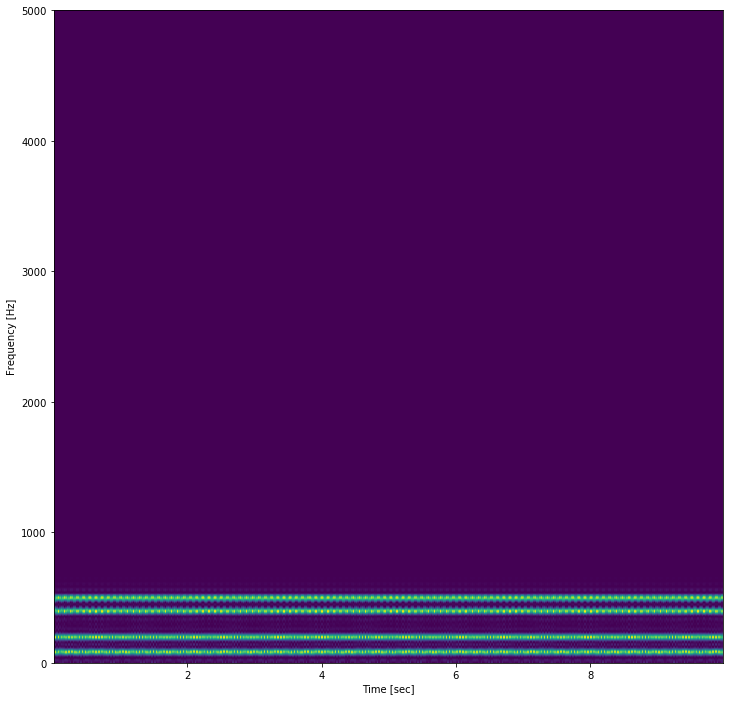

In [25]:
f, t, Sxx = signal.spectrogram(sig, samplerate, nfft=4096,)
plt.pcolormesh(t, f, Sxx)
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

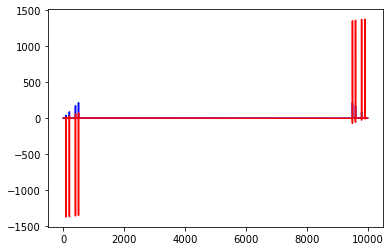

In [4]:
def remove_range(collection, padding, around):
    for i in range(padding * 2 + 1):
        index = around - padding + i
        if index < len(collection) / 2:
            collection[index] = 0
            collection[-index] = 0

transformed = np.fft.fft(signal)
count = np.arange(len(transformed))
# remove_range(transformed, 7, 86)
# remove_range(transformed, 7, 400)
plt.plot(count, transformed.real, "b", count, transformed.imag, "r")

In [23]:
inversed = np.fft.ifft(transformed)
plt.plot(np.arange(len(inversed)), inversed)
Audio(inversed, rate=samplerate)

NameError: name 'transformed' is not defined

In [55]:
source_files = [f"../TensorFlow/data/highfreq/{i}.wav" for i in range(1, 2)]

audio_files_data = np.array([], np.float32)
audio_files_indexes = []

sample_rate = 32000
sample_start = sample_rate * 60
sample_end = sample_rate * 70

for source in source_files:
    audio_files_indexes.append(len(audio_files_data))
    rate, data = wavfile.read(source)
    assert rate == sample_rate
    audio_files_data = np.concatenate((audio_files_data, data))

print(np.amax(audio_files_data))
print(np.amin(audio_files_data))
print("Sample rate:", sample_rate)

32767.0
-32768.0
Sample rate: 32000


In [13]:
for index in audio_files_indexes:
    start = index + sample_start
    end = index + sample_end
    display(Audio(audio_files_data[start:end], rate=sample_rate))

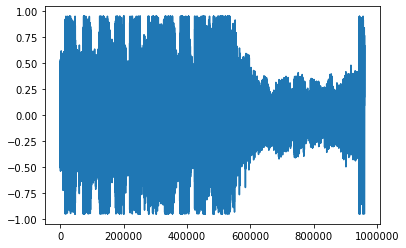

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


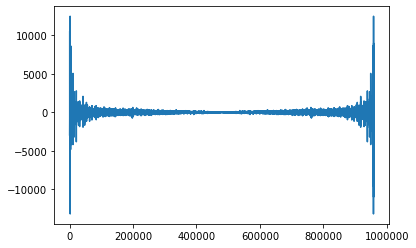

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


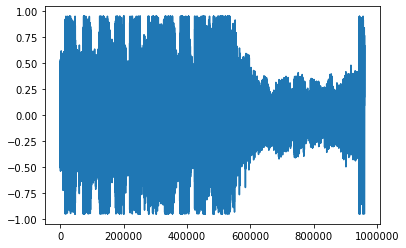

In [13]:
sample_start = sample_rate * 60
sample_end = sample_rate * 90
real_sample = audio_files_data[sample_start:sample_end]
plt.plot(np.arange(len(real_sample)), real_sample)
plt.show()
transformed = np.fft.fft(real_sample)
plt.plot(np.arange(len(transformed)), transformed)
plt.show()
inverse = np.fft.ifft(transformed)
plt.plot(np.arange(len(inverse)), inverse)
plt.show()

In [14]:
Audio(inverse, rate=sample_rate)

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\IPython\lib\display.py:158: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [16]:
def filter_fft_range(collection, start, end):
    result = np.copy(collection)
    def get_val(index, val):
        if start <= index <= end:
            return val
        return 0.0
    for i in np.arange(int(len(result) / 2)):
        if start <= i <= end:
            continue
        result[i] = 0
        result[-i] = 0
    return result

def plot_freq_range(inp, start, end, rate=sample_rate, plot=True):
    sample = filter_fft_range(inp, start, end)
    sample_inversed = np.fft.ifft(sample)
    if plot:
        plt.plot(np.arange(len(sample_inversed)), sample_inversed.real)
        plt.show()
        display(Audio(sample_inversed.real, rate=sample_rate))
    return sample_inversed.real

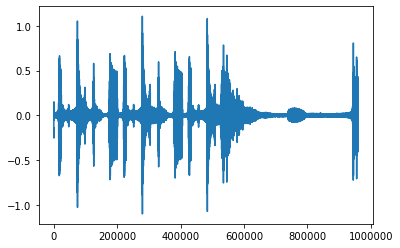

array([-0.14173401, -0.14451528, -0.14729051, ..., -0.13317441,
       -0.1360632 , -0.13890127])

In [17]:
plot_freq_range(transformed, 1500, 2500)

In [28]:
def split_to_freq_ranges(inp, start, end, steps):
    spectrum_per_step = int((end - start)  / steps)
    for i in range(steps):
        plot_freq_range(inp, start + i * spectrum_per_step, start + (i + 1) * spectrum_per_step)

def split_to_freq_range_steps(inp, steps):
    result = []
    for start, end in steps:
        result.append(plot_freq_range(inp, start, end, plot=False))
    return result

def make_spectrogram(inp, frequency_steps, sample_rate, step_duration):
    bucket_size = int(sample_rate * step_duration)
    buckets = int(len(inp) / bucket_size)
    result = [[] for _ in range(len(frequency_steps))]
    for i in range(buckets):
        start = i * bucket_size
        end = (i + 1) * bucket_size
        fftd = np.fft.fft(inp[start:end], sample_rate)
        frequencies = split_to_freq_range_steps(fftd, frequency_steps)
        for index, freq in enumerate(frequencies):
            result[index].append(max(max(freq), abs(min(freq))))
    return result

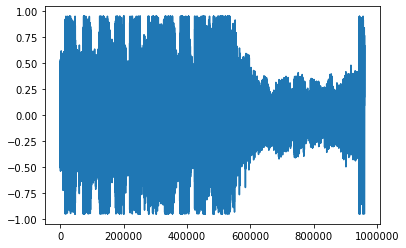

In [29]:
plt.plot(np.arange(len(real_sample)), real_sample)
plt.show()

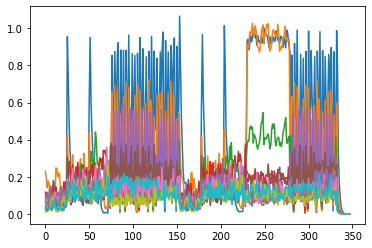

In [30]:
exponents = list((i * i * i * i for i in range(5, 15)))
steps = list(((exponents[i], exponents[i + 1]) for i in range(len(exponents) - 1)))
spectrogram = make_spectrogram(audio_files_data, (
    (0, 100),
    (100, 200),
    (200, 300),
    (300, 400),
    (400, 500),
    (500, 600),
    (600, 700),
    (700, 800),
    (800, 900),
    (900, 1000),
), sample_rate, 0.5)
# spectrogram = make_spectrogram(audio_files_data, steps, sample_rate, 1.0)
bucket_count = int(len(audio_files_data) / sample_rate)
count = np.arange(len(spectrogram[0]))
for freq in spectrogram:
    plt.plot(count, freq)
plt.show()

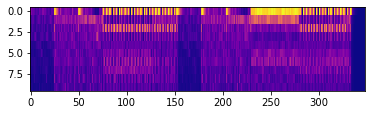

In [21]:
plt.imshow(spectrogram, cmap="plasma", vmin=0, vmax=1, aspect=bucket_count / 20)
plt.show()

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


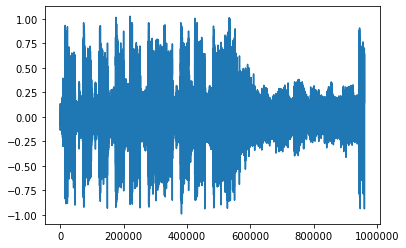

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


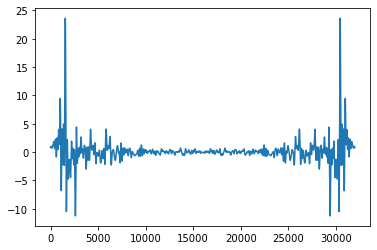

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\IPython\lib\display.py:158: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [27]:
step_size = 200
result = []
transformed_parts = []

for i in range(int(len(real_sample) / step_size)):
    start = i * step_size
    end = (i + 1) * step_size
    fftd = np.fft.fft(real_sample[start:end], sample_rate)
    transformed_parts.append(fftd)
    filtered = filter_fft_range(fftd, 0, 1000)
    result.extend(np.fft.ifft(filtered)[:step_size])

plt.plot(np.arange(len(result)), result)
plt.show()
plt.plot(np.arange(len(transformed_parts[10])), transformed_parts[10])
plt.show()
Audio(result, rate=sample_rate)

d:\git\mythicmaniac\notebooks\venv\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


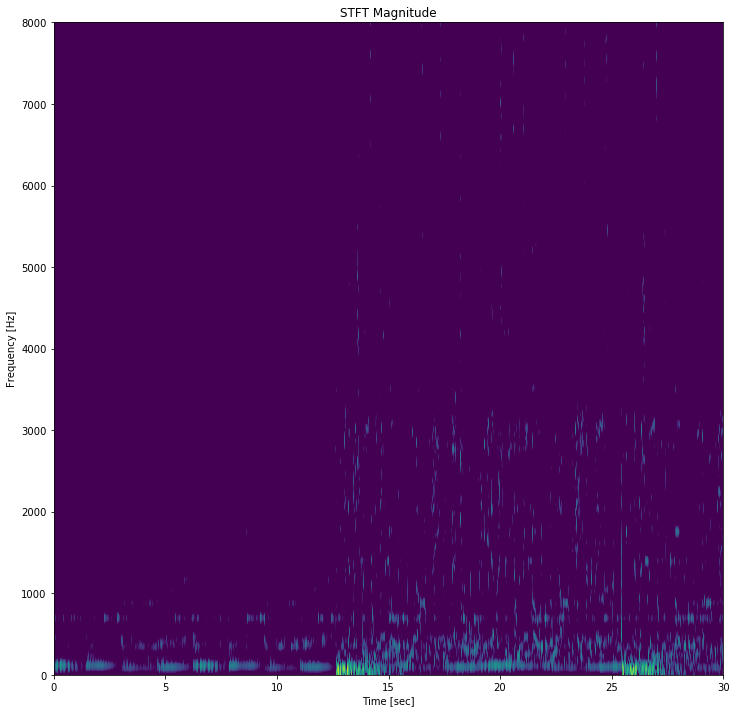

In [131]:
f, t, zxx = signal.stft(audio_files_data[:sample_rate * 30], sample_rate, nfft=4096, nperseg=512)
result = np.log10(np.abs(zxx))
result /= np.amax(result)
result = result - 0.70
plt.pcolormesh(t, f, result, vmin=0)
plt.title('STFT Magnitude')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim((0, 8000))
plt.show()

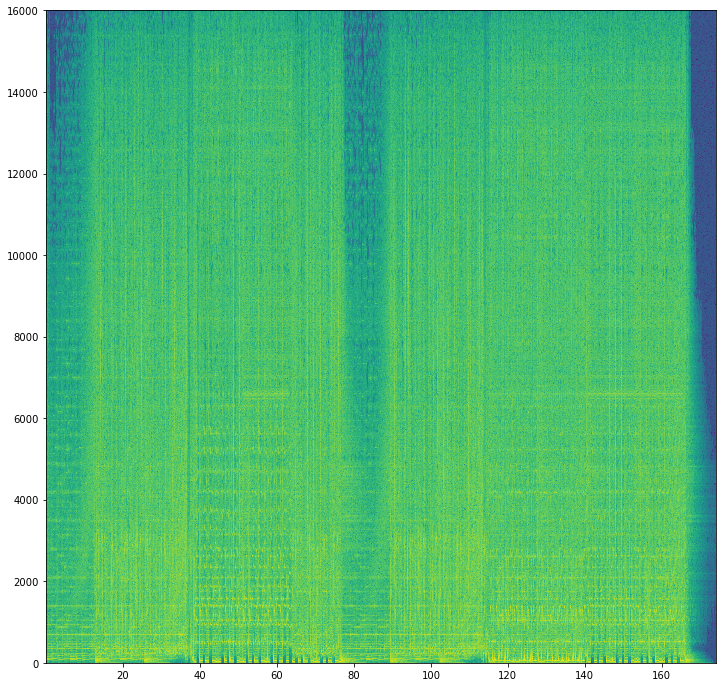

In [83]:
plt.specgram(audio_files_data, NFFT=4096, Fs=sample_rate, scale="dB")
plt.show()

In [55]:
reversed_zxx = signal.istft(zxx, sample_rate)
display(Audio(real_sample, rate=sample_rate))
display(Audio(reversed_zxx[1], rate=sample_rate))